# Predict Credit Card Churning Customers

* **Problem Statement:** A bank manager is uncomfortable with more and more customers leaving their credit card services. 

* **Goal:** Predict customers who are likely drop off from credit card services(going to churn) for a bank so that they can proactively go to the customer to provide them better services and turn customers' decisions in the opposite direction.

* **Advantage:** Data is clean, so relatively less time to spend on data cleaning and more time on modelling

* **Disadvantage:** Data is unbalanced; only 16.07% of customers churned. Thus, it's a bit difficult to train our model to predict churning customers.


I am going to apply **5 Supervised Machine Learning models** on the given dataset to predict churning customers.

The strategy is to apply default model first with no tuning of the hyperparameter and then tuned them with different hyperparameter values and compare them by their "**Recall**" value because goal is to **decrease False Negative number** because **we don’t want to lose any client**. If client churns, we want to predict correctly (as churned = 1). High Recall/Sensitivity has a low False Negative rate, so that we want to increase Recall.

The models used are as follows: 
1. **Logistic Regression**
2. **Ridge Classifier**
3. **KNeighborsClassifier**
4. **Random Forest**

# *Exploratory Data Analysis*

## Import Libraries & Data

In [41]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

%matplotlib inline

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [42]:
bankchurners = pd.read_csv("/Users/SURGE\Desktop/BankChurners.csv")
bankchurners

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


## List Variables

In [43]:
bankchurners.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [44]:
# in data description, it says ignore last 2 columns(Naive_Bayes_Class..)
# see here: https://www.kaggle.com/sakshigoyal7/credit-card-customers
# so that I'm dropping them
bankchurners.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], axis=1, inplace=True)

In [45]:
bankchurners.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [46]:
bankchurners.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [47]:
bankchurners.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


In [48]:
bankchurners._get_numeric_data()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [49]:
# Droping CLIENTNUM columns because Client numberis unique identifier for the customer holding the account
# So this number doesn't really effect our churn prediction.
bankchurners.drop(['CLIENTNUM'], axis=1, inplace=True)

In [50]:
# All columns
cols = bankchurners.columns
# Find numerical columns
num_cols = bankchurners._get_numeric_data().columns
num_cols

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [51]:
# Categorical Columns
categorical = list(set(cols) - set(num_cols))
categorical

['Attrition_Flag',
 'Education_Level',
 'Gender',
 'Card_Category',
 'Marital_Status',
 'Income_Category']

## About Data
**10127 rows x 21 columns**

**7 categorical features**
* Customer_id
* Attrition_Flag (1: Existing Customer, 0: Attrited Customer): The Customer leave or not
* Gender (1: Male, 0: Female)
* Education_Level (Graduate , High School, Unknown, Uneducated, College, Post-Graduate, Doctorate)
* Marital_Status (Married, Single, Unknown, Divorced)
* Income_Category (Less than 40K, 40K - 60K, 80K - 120K, 60K - 80K, Unknown, 120K +) in dollar
* Card_Category (Blue, Silver, Gold, Platinum)

**14 numerical features:**
* Customer_Age: Customer's Age in Years
* Dependent_count: Number of dependents
* Months_on_book: Period of relationship with bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio


In [52]:
def pltCountplot(cat, df):
    num_plots = len(cat)
    cols = 2
    rows = (num_plots + 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()  # Flatten to 1D array for easier iteration

    for index, category in enumerate(cat):
        ax = sns.countplot(x=category, data=df, ax=axes[index])
        # ax.set_xticklabels(ax.get_xticklabels(), rotation=15)  # Optionally rotate labels if needed
        for p in ax.patches:
            height = p.get_height()
            ax.text(p.get_x() + p.get_width() / 2., height + 3, '{:1.2f}%'.format(height / len(df) * 100), ha="center", fontsize=14)

    for i in range(index + 1, len(axes)):
        axes[i].axis('off')  # Turn off unused subplots

    plt.tight_layout()
    plt.show()

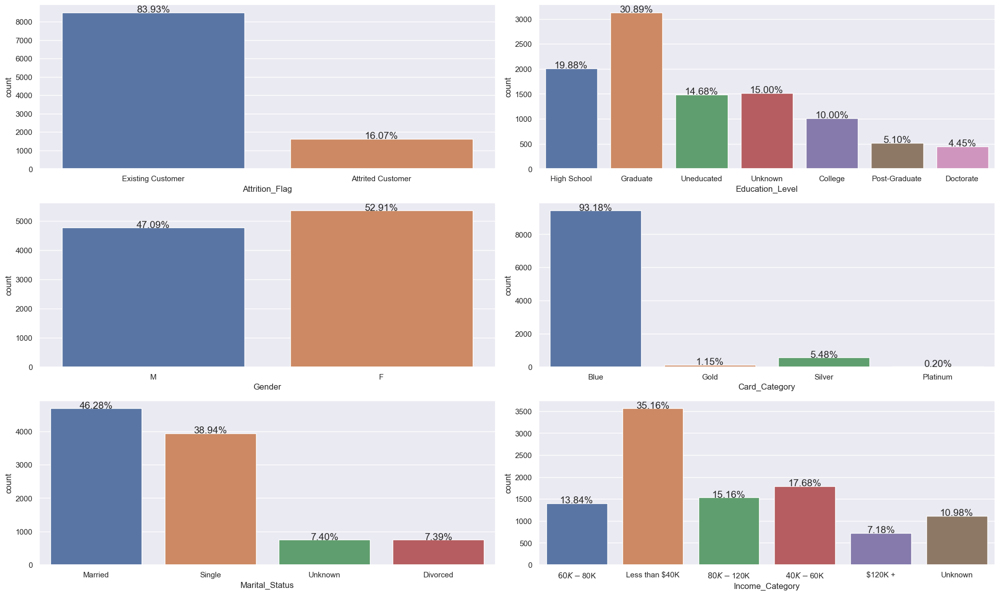

In [53]:
# Plot categorical columns
pltCountplot(categorical, bankchurners);

We can see in the card category, generally clients use Blue card.

In [54]:
bankchurners['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

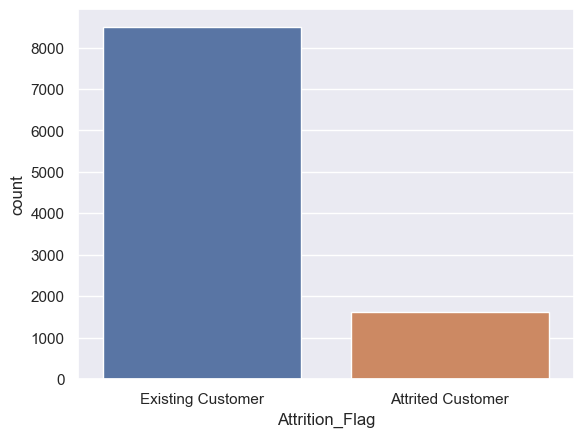

In [55]:
# as we can see here, only 16.07% of customers who have churned.
sns.countplot(x='Attrition_Flag', data=bankchurners)
plt.show()

As we can see here, dataset is not equally distribute according to Attrition_Flag. Only **16.07%** of customers who have churned among 10k clients.

In [56]:
# Plot categorical columns with different y
def pltcrosstab(cat, df):
    
    fig, axis = plt.subplots((len(cat) // 3), 3, figsize=(16,8))  
    fig.tight_layout()

    index = 0
    sns.set()
    for i in range((len(cat) // 3)):
            
        for j in range(3):
            
            # Since we have 11 numerical columns, some plots will be empty
            if index == len(cat):
                break
            
            ax = pd.crosstab(df[cat[index]], df['Attrition_Flag']).plot(kind='bar', ax=axis[i][j])
        
            for item in ax.get_xticklabels():
                item.set_rotation(20)

            for p in ax.patches:
                height = p.get_height()
                ax.text(p.get_x()+p.get_width(), height + 3, '{:1.2f}%'.format(height/len(df)*100), ha="center", fontsize=8) 
            
            index += 1
            
    plt.subplots_adjust(wspace=0.2, hspace=0.4)

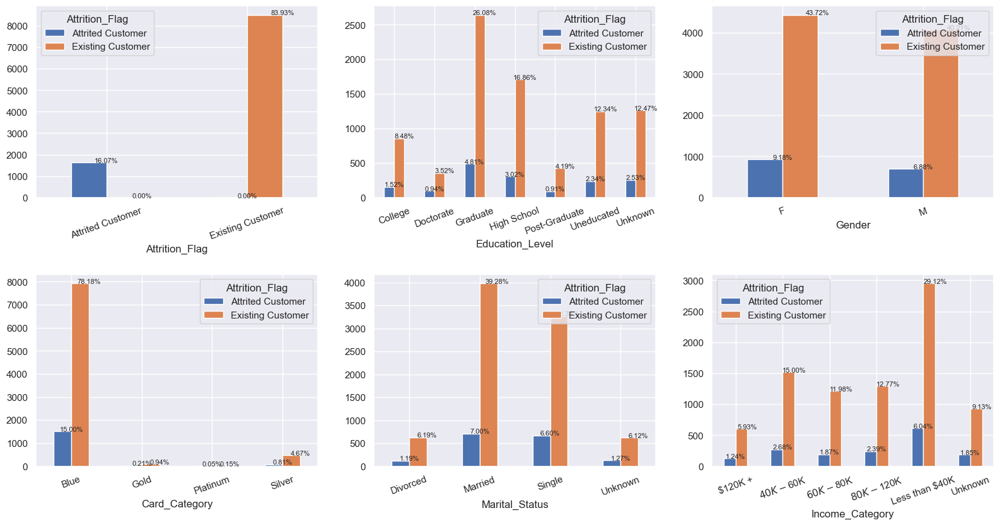

In [57]:
# Plot categorical columns with different Attrition_Flag
pltcrosstab(categorical, bankchurners);

We can see in above plots, with different attrention_flag, how our categorical values change and also can see in which categiries we seeing churning customers the most.

* **%93.17** of churned clients have Blue card
* **%35.15** of churned clients have less than $40K 
* **%46.28** of churned clients are married
* **%30.88** of churned clients have graduate education level

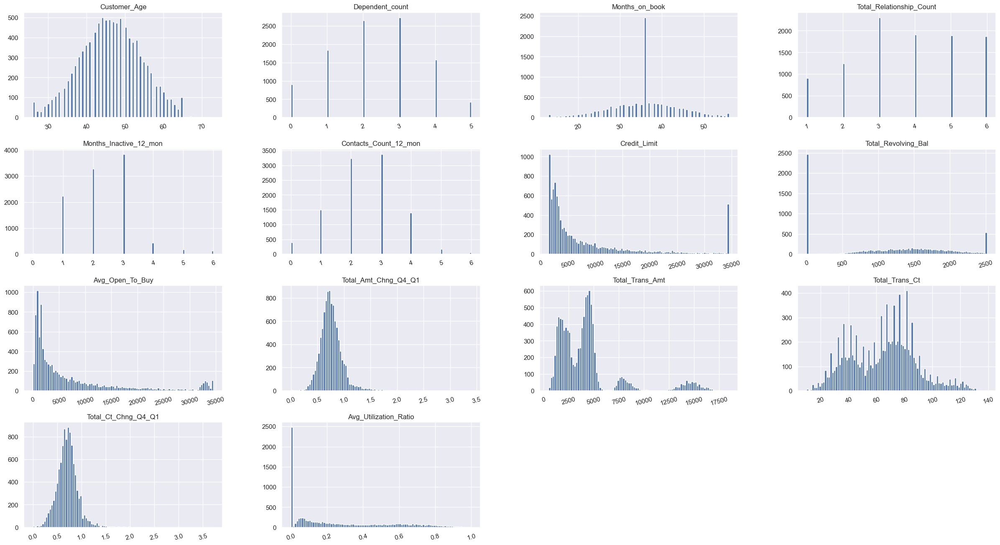

In [58]:
# Check distribution of numerical features
bankchurners.hist(figsize=(30,16), xrot=15, bins=int(bankchurners.shape[0]**0.5));

In [59]:
from scipy.stats import norm
def plotDistPlot(df, columns):
    fig, ax = plt.subplots(len(columns)//3, 3,figsize=(20, 12))
    
    index = 0
    for i in range(2):
        for j in range(3):
            sns.distplot(df.loc[:, columns[index]],
                         hist=True,
                         fit=norm,
                         kde=True,
                         ax=ax[i][j])
            ax[i][j].set_title(columns[index])
            ax[i][j].legend(labels=['Normal', 'Actual'])
            index += 1

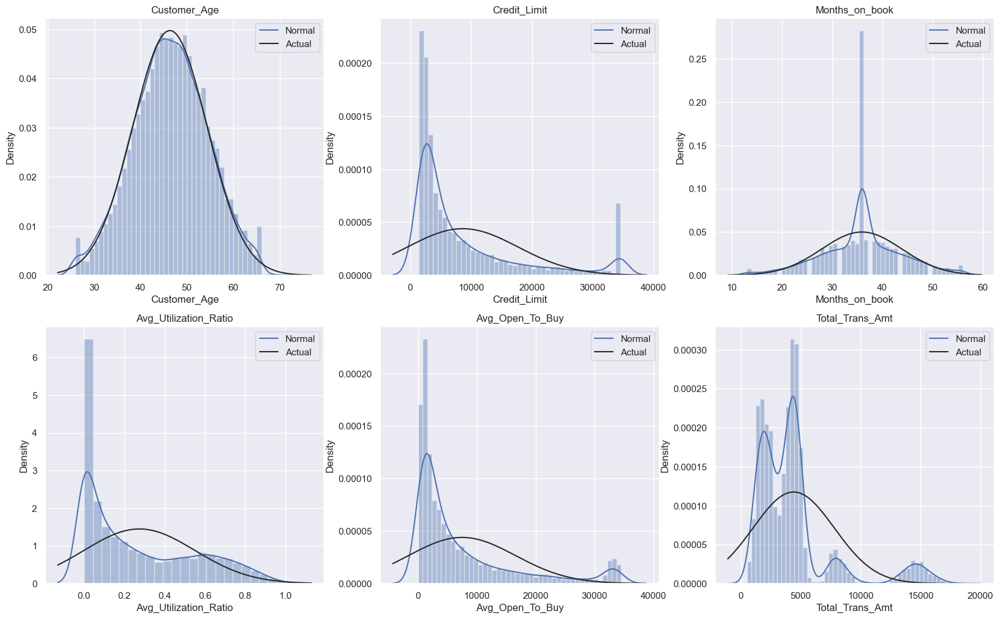

In [60]:
some_columns = ['Customer_Age','Credit_Limit','Months_on_book','Avg_Utilization_Ratio','Avg_Open_To_Buy','Total_Trans_Amt']
plotDistPlot(bankchurners, some_columns)

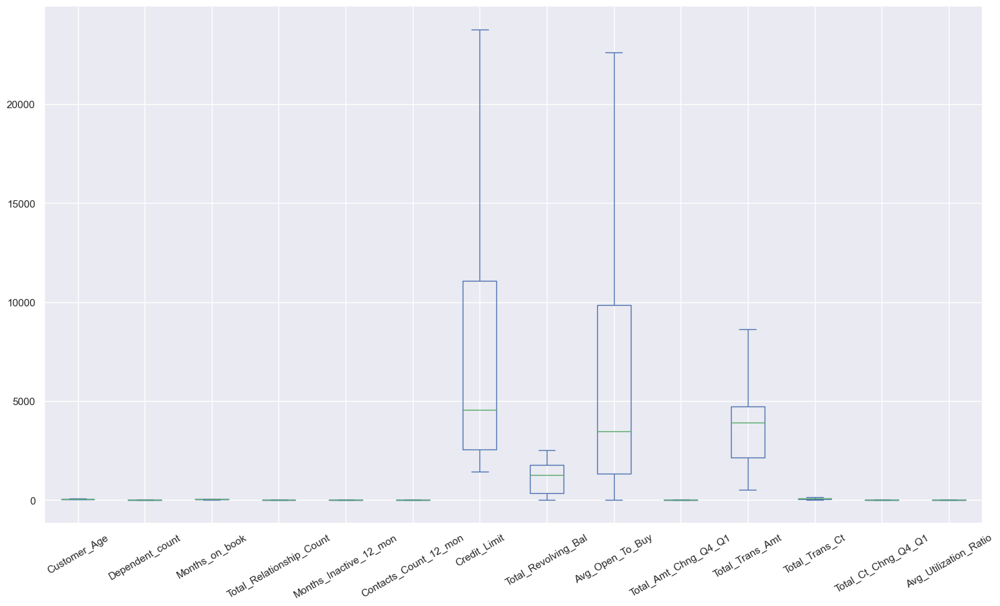

In [61]:
bankchurners.plot(kind='box', figsize = (18,10), rot=30, showfliers=False);

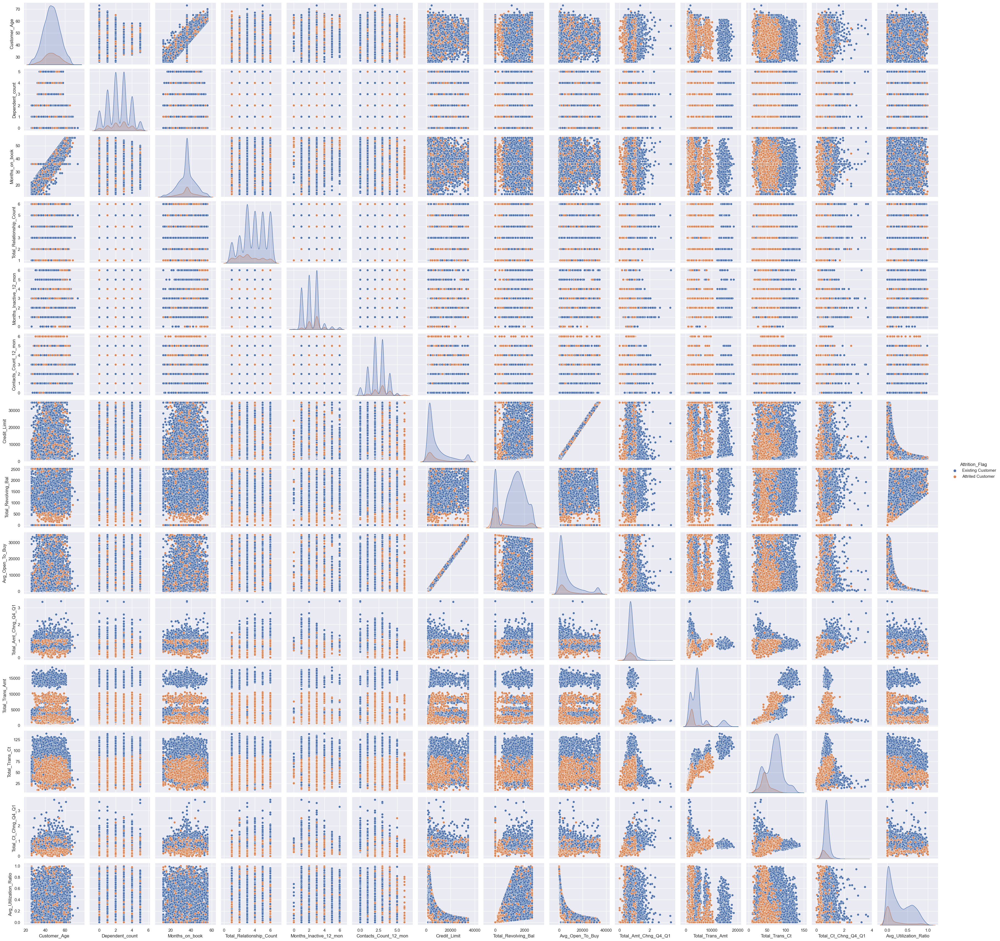

In [62]:
# Check distribution of numerical features
sns.pairplot(bankchurners, hue='Attrition_Flag', height=2.5)

Here we can see all numerical columns and Attrition_Flag distribution

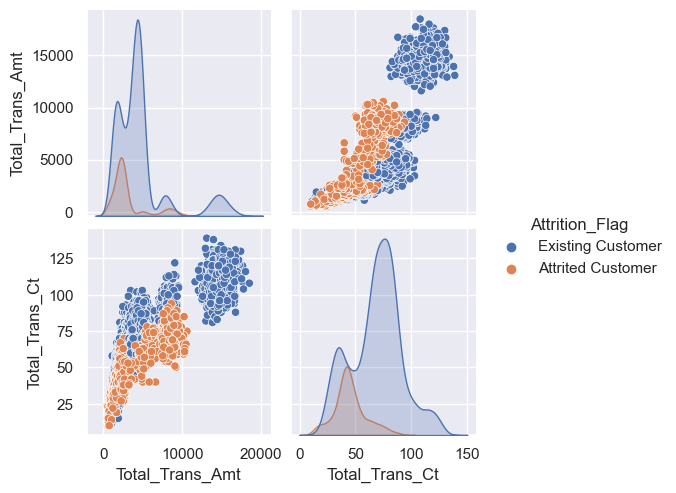

In [63]:
sns.pairplot(bankchurners, vars=['Total_Trans_Amt','Total_Trans_Ct'], hue='Attrition_Flag', height=2.5)

This one is interesting that found in above pairplot of numerical columns, people who churned from credit card service, had less transaction count and transaction amount!


## Check Correlation

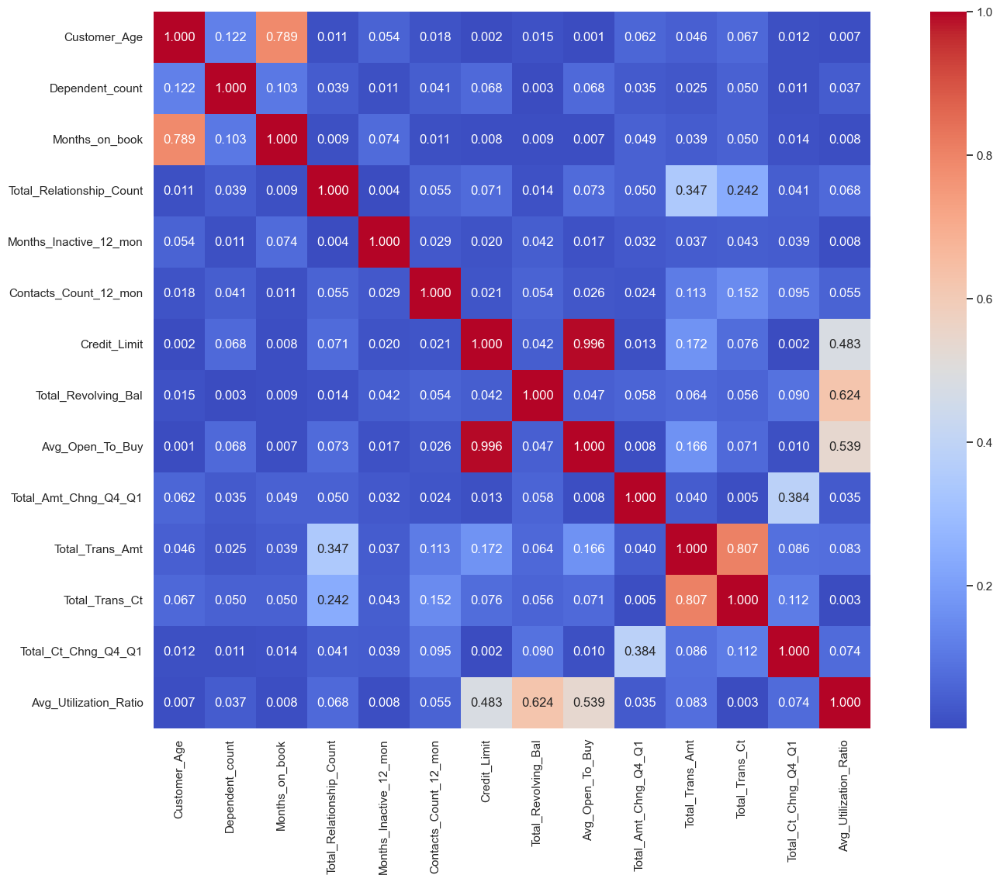

In [64]:
num_cols = bankchurners._get_numeric_data().columns
corr_data = bankchurners.loc[:, num_cols].corr()

plt.figure(figsize=(20,12))
sns.heatmap(corr_data.abs(), annot=True, fmt='.3f',cmap='coolwarm',square=True)
plt.show()

`Months_on_book` seems like correlated with `Customer_Age` .

`Total Transaction Count` is correlated with `Total Transaction Amount`.

## Feature Engineering

Change categorical Attrition_Flag feature to numerical feature and rename it as churn.

In [65]:
# tag churned users as 1, rest as 0 and rename column
bankchurners['Attrition_Flag'].replace(('Existing Customer','Attrited Customer'), (0,1), inplace=True)

In [66]:
bankchurners.rename(columns={'Attrition_Flag':'churn'}, inplace=True)

In [67]:
bankchurners['Income_Category'].value_counts()

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64

In [68]:
bankchurners['churn'].value_counts()

churn
0    8500
1    1627
Name: count, dtype: int64

In [69]:
# If I remove unknown data from income_category, i'm losing 11% of my data, so I'm leaving it.
bankchurners[bankchurners['Income_Category']!='Unknown']['churn'].value_counts()

churn
0    7575
1    1440
Name: count, dtype: int64

In [70]:
# If I removed all 'unknown' data, I lose more than %30 of my data, so I'm going to leave them
bankchurners[(bankchurners['Income_Category']!='Unknown') & (bankchurners['Education_Level']!='Unknown') & (bankchurners['Marital_Status']!='Unknown')]['churn'].value_counts()

churn
0    5968
1    1113
Name: count, dtype: int64

Convert income category to numerical values(preferred to give order depending on their income category instead of get dummies to avoid increasing the dataset size)

In [71]:
# Wanted to order income category because I didn't want to increase my feature column numbers by getting dummies from income category
bankchurners_df = bankchurners.copy()
bankchurners_df['Income_Category'] = bankchurners_df['Income_Category'].replace({'Unknown': 0 ,'Less than $40K':1, '$40K - $60K':2, 
                                                      '$80K - $120K':3, '$60K - $80K':4, '$120K +':5})

In [72]:
bankchurners_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   churn                     10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  int64  
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

#### Get dummies for rest of the categorical features.

In [73]:
categorical = bankchurners_df.select_dtypes(include='object').columns
bankchurners_df = pd.get_dummies(bankchurners_df, columns = categorical, drop_first=True)

In [74]:
bankchurners_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   churn                          10127 non-null  int64  
 1   Customer_Age                   10127 non-null  int64  
 2   Dependent_count                10127 non-null  int64  
 3   Income_Category                10127 non-null  int64  
 4   Months_on_book                 10127 non-null  int64  
 5   Total_Relationship_Count       10127 non-null  int64  
 6   Months_Inactive_12_mon         10127 non-null  int64  
 7   Contacts_Count_12_mon          10127 non-null  int64  
 8   Credit_Limit                   10127 non-null  float64
 9   Total_Revolving_Bal            10127 non-null  int64  
 10  Avg_Open_To_Buy                10127 non-null  float64
 11  Total_Amt_Chng_Q4_Q1           10127 non-null  float64
 12  Total_Trans_Amt                10127 non-null 

#### Examine the correlations between the features and the target.

In [75]:
# Examine the correlations between the features and the target.
corr = bankchurners_df.select_dtypes(include=[np.number]).corr()
print (corr['churn'].sort_values(ascending=False)[:5], '\n')
print (corr['churn'].sort_values(ascending=False)[-5:])

churn                     1.000000
Contacts_Count_12_mon     0.204491
Months_Inactive_12_mon    0.152449
Dependent_count           0.018991
Customer_Age              0.018203
Name: churn, dtype: float64 

Total_Trans_Amt         -0.168598
Avg_Utilization_Ratio   -0.178410
Total_Revolving_Bal     -0.263053
Total_Ct_Chng_Q4_Q1     -0.290054
Total_Trans_Ct          -0.371403
Name: churn, dtype: float64


#### Check corralated features with eachother

In [76]:
# Check corralated features with eachother
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.select_dtypes(include=[np.number]).columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    corr = df.select_dtypes(include=[np.number]).corr()
    au_corr = corr.abs().unstack()
    labels_to_drop = get_redundant_pairs(df.select_dtypes(include=[np.number]))
    #From corrolation table, drop the diagonals(which gives 1 corr)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(bankchurners_df, 10))

Top Absolute Correlations
Credit_Limit          Avg_Open_To_Buy          0.995981
Total_Trans_Amt       Total_Trans_Ct           0.807192
Customer_Age          Months_on_book           0.788912
Total_Revolving_Bal   Avg_Utilization_Ratio    0.624022
Avg_Open_To_Buy       Avg_Utilization_Ratio    0.538808
Credit_Limit          Avg_Utilization_Ratio    0.482965
Income_Category       Credit_Limit             0.420381
                      Avg_Open_To_Buy          0.417736
Total_Amt_Chng_Q4_Q1  Total_Ct_Chng_Q4_Q1      0.384189
churn                 Total_Trans_Ct           0.371403
dtype: float64


## Modelling

### Logistic Regression

In [77]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

First let's built and try it on simple model.

In [78]:
# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
# stratify=y preserve the proportion of target as in orginal dataset in the train and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

# set the model
logreg = LogisticRegression()

# fit model
logreg.fit(X_train, y_train)

LogisticRegression()

In [79]:
# Baseline accuracy = proportion of the majority class
print('Baseline Accuracy: ',1. - y_train.mean())
print('Train Accuracy :',logreg.score(X_train, y_train))
print('Test Accuracy: ',logreg.score(X_test, y_test))

Baseline Accuracy:  0.8393680052666228
Train Accuracy : 0.8894009216589862
Test Accuracy:  0.891785150078989


In [80]:
# confusion matrix
y_pred = logreg.predict(X_test)
cf = metrics.confusion_matrix(y_test, y_pred)
pd.DataFrame(cf, columns=['pred neg','pred pos'], index=['actual neg','actual pos'])

,pred neg,pred pos
actual neg,2064,61
actual pos,213,194


In [81]:
from IPython import display
def confisuon_matrix_summary(y_test, model, treshold):
    
    model_pred_proba = model.predict_proba(X_test)[:,1]
    cf = metrics.confusion_matrix(y_true=y_test, y_pred=model_pred_proba > treshold)
    cm = pd.DataFrame(cf, columns=['pred neg','pred pos'], index=['actual neg','actual pos'])
    
    display.display(cm)
    
    print('Classification treshold is ', treshold)
    # Recall, also known as the sensitivity, hit rate, or the true positive rate (TPR), is the proportion of the total amount of relevant instances that were actually retrieved. 
    # It answers the question “What proportion of actual positives was identified correctly?”
    print('True Positive Rate/Recall = TP/(TP+FN) :', cf[1][1] / (cf[1][1] + cf[1][0]))     #same as metrics.recall_score(y_test,y_pred)
    print('False Positive Rate = FP/(FP+TN) :', cf[0][1] / (cf[0][1] + cf[0][0]))
    # Accuracy - ratio of correctly predicted observation to the total observations.
    print('Accuracy = (TP+TN)/total :', (cf[1][1]+cf[0][0])/(cf[1][1]+cf[0][0]+cf[0][1]+cf[1][0]))
    # Precision - Precision is the ratio of correctly predicted positive observations to the total predicted positive observations
    # It answers the question “What proportion of positive identifications was actually correct?”
    print('Precision = TP/(TP+FP) :',  (cf[1][1]/(cf[1][1]+cf[0][1])))   #same as metrics.precision_score(y_test,y_pred)
    
confisuon_matrix_summary(y_test, logreg, 0.5)

,pred neg,pred pos
actual neg,2064,61
actual pos,213,194


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.47665847665847666
False Positive Rate = FP/(FP+TN) : 0.028705882352941175
Accuracy = (TP+TN)/total : 0.891785150078989
Precision = TP/(TP+FP) : 0.7607843137254902


In [82]:
from IPython import display
# normalise confusion matrix with 'weighted'(calculate metrics for each label) precisions
def verify_performance(y_true, y_pred, model, display_matrix=True):
    print(f"Weighted Average Precision: {metrics.precision_score(y_true, y_pred, average='weighted'):.4f}")  
    confusion_matrix = pd.DataFrame(
        metrics.confusion_matrix(y_true, y_pred, normalize='true'),
        index=model.classes_, columns=model.classes_).round(2)
      
    display.display(pd.Series(
        np.diagonal(confusion_matrix.T), 
        index=confusion_matrix.index, 
        name='individual precision').to_frame().T)
  
    if display_matrix:
        display.display(confusion_matrix)
        
verify_performance(y_test, y_pred, logreg)

Weighted Average Precision: 0.8830


,0,1
individual precision,0.97,0.48


,0,1
0,0.97,0.03
1,0.52,0.48


In [83]:
# We can vary the classification threshold for our model to get different predictions.
# By setting a lower probability threshold we will predict more positive classes. Which means we will predict more true positives, but fewer true negatives.

# confusion matrix (changing threshold to 0.4)
confisuon_matrix_summary(y_test, logreg, 0.4)

,pred neg,pred pos
actual neg,2014,111
actual pos,170,237


Classification treshold is  0.4
True Positive Rate/Recall = TP/(TP+FN) : 0.5823095823095823
False Positive Rate = FP/(FP+TN) : 0.05223529411764706
Accuracy = (TP+TN)/total : 0.8890205371248026
Precision = TP/(TP+FP) : 0.6810344827586207


In [84]:
logreg_pred_proba = logreg.predict_proba(X_test)[:,1]
verify_performance(y_test, logreg_pred_proba > .4, logreg)

Weighted Average Precision: 0.8834


,0,1
individual precision,0.95,0.58


,0,1
0,0.95,0.05
1,0.42,0.58


In [85]:
# Examine the intercept.
logreg.intercept_

array([0.06500908])

In [86]:
# Examine the coefficients.
# The higher the coefficient, the higher the “importance” of a feature.

coefficients = list(zip(X_train.columns, logreg.coef_[0]))
coefficients

[('Customer_Age', 0.03312290309874764),
 ('Dependent_count', 0.34057499470932395),
 ('Income_Category', -0.08259805395814133),
 ('Months_on_book', -0.0027092685843142623),
 ('Total_Relationship_Count', -0.4027006849478936),
 ('Months_Inactive_12_mon', 0.48193414450500077),
 ('Contacts_Count_12_mon', 0.6184581363107813),
 ('Credit_Limit', -0.00032578232764119466),
 ('Total_Revolving_Bal', -0.0006452231159301172),
 ('Avg_Open_To_Buy', 0.0003194407887432146),
 ('Total_Amt_Chng_Q4_Q1', -0.02962727135392248),
 ('Total_Trans_Amt', 0.0003683241149601687),
 ('Total_Trans_Ct', -0.09750591944364372),
 ('Total_Ct_Chng_Q4_Q1', -0.12117094426140307),
 ('Avg_Utilization_Ratio', 0.0066818265150120045),
 ('Gender_M', -0.07802082929904282),
 ('Education_Level_Doctorate', 0.013881297300802963),
 ('Education_Level_Graduate', 0.009836427556815228),
 ('Education_Level_High School', 0.008188499703099669),
 ('Education_Level_Post-Graduate', 0.013011007356423403),
 ('Education_Level_Uneducated', -0.0040493006

Mean of Accuracy for all  5  folds:  Accuracy:  0.8568294638831
Mean of Precision  5  folds:  Precision:  0.8790207288944384
Mean of Recall  5  folds:  Recall:  0.8568294638831
Mean of Accuracy for all  6  folds:  Accuracy:  0.8450707061058873
Mean of Precision  6  folds:  Precision:  0.8735703371667434
Mean of Recall  6  folds:  Recall:  0.8450707061058873
Mean of Accuracy for all  7  folds:  Accuracy:  0.8523816624465557
Mean of Precision  7  folds:  Precision:  0.8754291030416247
Mean of Recall  7  folds:  Recall:  0.8523816624465557
Mean of Accuracy for all  8  folds:  Accuracy:  0.8563162273882446
Mean of Precision  8  folds:  Precision:  0.8759457482088852
Mean of Recall  8  folds:  Recall:  0.8563162273882446
Mean of Accuracy for all  9  folds:  Accuracy:  0.8517021248602066
Mean of Precision  9  folds:  Precision:  0.8750537720607094
Mean of Recall  9  folds:  Recall:  0.8517021248602066


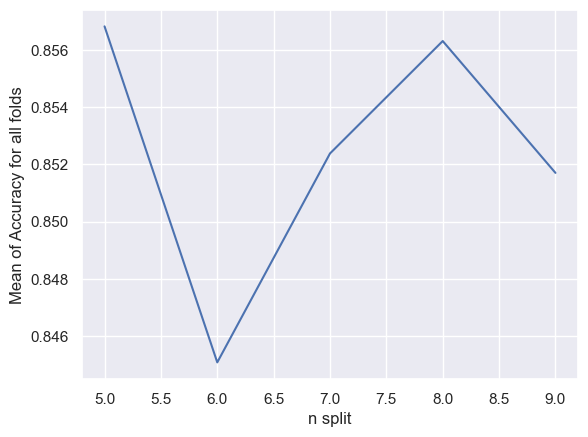

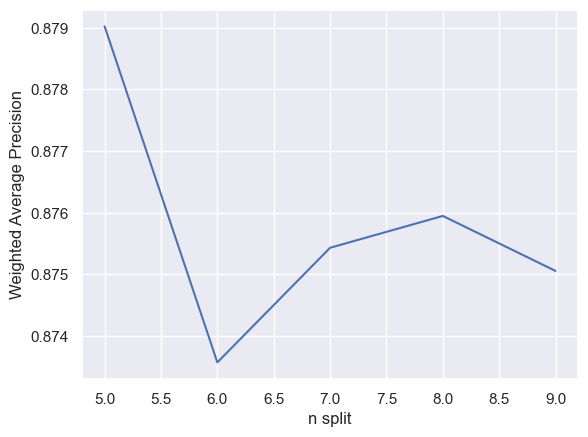

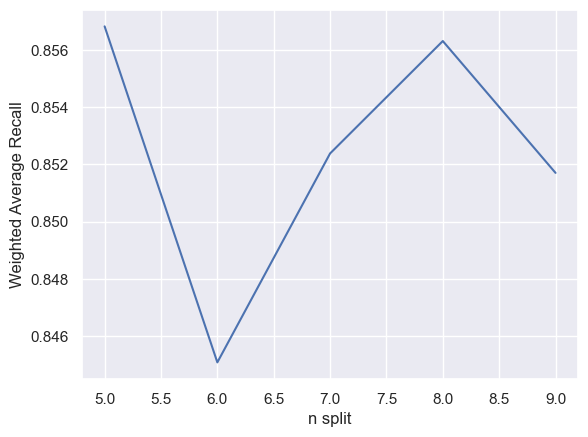

In [87]:
# K-folds Cross Validation
from sklearn.model_selection import cross_val_score

def cross_val_accuracy_precision(model, X, y):
    acc = []
    precisions=[]
    recalls=[]
    for n in range(5,10):

        # Note the results will vary each run since we take a different
        # subset of the data each time (since shuffle=True)
        scores = np.mean(cross_val_score(model, X, y, cv=n, scoring='accuracy'))
        acc.append(scores)
        p = np.mean(cross_val_score(model, X, y, cv=n, scoring=metrics.make_scorer(metrics.precision_score, average='weighted')))
        precisions.append(p)
        r = np.mean(cross_val_score(model, X, y, cv=n, scoring=metrics.make_scorer(metrics.recall_score, average='weighted')))
        recalls.append(r)
        print('Mean of Accuracy for all ', str(n), ' folds: ', 'Accuracy: ', scores)
        print('Mean of Precision ', str(n), ' folds: ', 'Precision: ', p)
        print('Mean of Recall ', str(n), ' folds: ', 'Recall: ', r)
        
    # plot to see clearly
    plt.plot(range(5,10), acc)
    plt.xlabel('n split')
    plt.ylabel('Mean of Accuracy for all folds')
    plt.show();
    plt.plot(range(5,10), precisions)
    plt.xlabel('n split')
    plt.ylabel('Weighted Average Precision')
    plt.show();
    plt.plot(range(5,10), recalls)
    plt.xlabel('n split')
    plt.ylabel('Weighted Average Recall')
    plt.show();
    
logreg_cv=LogisticRegression()
cross_val_accuracy_precision(logreg_cv, X, y)

#### Parameter Tuning with GridSearch

In [88]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

pipe = Pipeline([('classifier' , LogisticRegression())])
# pipe = Pipeline([('classifier', RandomForestClassifier())])

# Create param grid.

param_grid = [
    {'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 4, 20),
    'classifier__solver' : ['liblinear']}]

clf = GridSearchCV(pipe, 
                   param_grid = param_grid, 
                   cv = 5, 
                   scoring=metrics.make_scorer(metrics.recall_score), # maximise recall to minimise FN
                   return_train_score=True,
                   n_jobs=-1,
                   verbose=True)
clf.fit(X, y)  
clf.best_estimator_

Fitting 5 folds for each of 40 candidates, totalling 200 fits


Pipeline(steps=[('classifier',
                 LogisticRegression(C=545.5594781168514, penalty='l1',
                                    solver='liblinear'))])

In [89]:
# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

# set the model
logreg = LogisticRegression(C=3792.690190732246, penalty='l1',
                                    solver='liblinear')

# fit model
logreg.fit(X_train, y_train)

LogisticRegression(C=3792.690190732246, penalty='l1', solver='liblinear')

In [90]:
confisuon_matrix_summary(y_test, logreg, 0.5)       

,pred neg,pred pos
actual neg,2054,71
actual pos,172,235


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.5773955773955773
False Positive Rate = FP/(FP+TN) : 0.033411764705882356
Accuracy = (TP+TN)/total : 0.9040284360189573
Precision = TP/(TP+FP) : 0.7679738562091504


In [91]:
verify_performance(y_test, y_pred, logreg)

Weighted Average Precision: 0.8830


,0,1
individual precision,0.97,0.48


,0,1
0,0.97,0.03
1,0.52,0.48


### Ridge Classifier

Let's create simple Ridge model

In [92]:
# RidgeClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.preprocessing import StandardScaler

# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

ridge = RidgeClassifier()
ridge.fit(X_train, y_train)

RidgeClassifier()

In [93]:
print('Train Accuracy :',ridge.score(X_train, y_train))
print('Test Accuracy: ',ridge.score(X_test, y_test))

Train Accuracy : 0.8986175115207373
Test Accuracy:  0.9048183254344392


In [94]:
# Baseline accuracy = proportion of the majority class
1. - y_train.mean()

0.8393680052666228

In [95]:
from IPython import display
def confisuon_matrix_summary_ridge(y_test, model):
    # confusion matrix
    y_pred = model.predict(X_test)
    cf = metrics.confusion_matrix(y_test, y_pred)
    cm = pd.DataFrame(cf, columns=['pred neg','pred pos'], index=['actual neg','actual pos'])

    display.display(cm)
    
    print('Classification treshold is 0.5')
    # Recall, also known as the sensitivity, hit rate, or the true positive rate (TPR), is the proportion of the total amount of relevant instances that were actually retrieved. 
    # It answers the question “What proportion of actual positives was identified correctly?”
    print('True Positive Rate/Recall = TP/(TP+FN) :', cf[1][1] / (cf[1][1] + cf[1][0]))     #same as metrics.recall_score(y_test,y_pred)
    print('False Positive Rate = FP/(FP+TN) :', cf[0][1] / (cf[0][1] + cf[0][0]))
    # Accuracy - ratio of correctly predicted observation to the total observations.
    print('Accuracy = (TP+TN)/total :', (cf[1][1]+cf[0][0])/(cf[1][1]+cf[0][0]+cf[0][1]+cf[1][0]))
    # Precision - Precision is the ratio of correctly predicted positive observations to the total predicted positive observations
    # It answers the question “What proportion of positive identifications was actually correct?”
    print('Precision = TP/(TP+FP) :',  (cf[1][1]/(cf[1][1]+cf[0][1])))   #same as metrics.precision_score(y_test,y_pred)
confisuon_matrix_summary_ridge(y_test, ridge)

,pred neg,pred pos
actual neg,2098,27
actual pos,214,193


Classification treshold is 0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.4742014742014742
False Positive Rate = FP/(FP+TN) : 0.012705882352941176
Accuracy = (TP+TN)/total : 0.9048183254344392
Precision = TP/(TP+FP) : 0.8772727272727273


In [96]:
y_pred = ridge.predict(X_test)
verify_performance(y_test, y_pred, ridge)

Weighted Average Precision: 0.9026


,0,1
individual precision,0.99,0.47


,0,1
0,0.99,0.01
1,0.53,0.47


#### Parameter Tuning with GridSearch

Mean of Accuracy for all  5  folds:  Scores:  0.8701533886634248
Mean of Precision  5  folds:  Precision:  0.8906426266189676
Mean of Accuracy for all  6  folds:  Scores:  0.8805153548509136
Mean of Precision  6  folds:  Precision:  0.8951739442659036
Mean of Accuracy for all  7  folds:  Scores:  0.8844666594840801
Mean of Precision  7  folds:  Precision:  0.8943235729525242
Mean of Accuracy for all  8  folds:  Scores:  0.8860451048710888
Mean of Precision  8  folds:  Precision:  0.8940142901409064
Mean of Accuracy for all  9  folds:  Scores:  0.8889159046553955
Mean of Precision  9  folds:  Precision:  0.8953450816880141


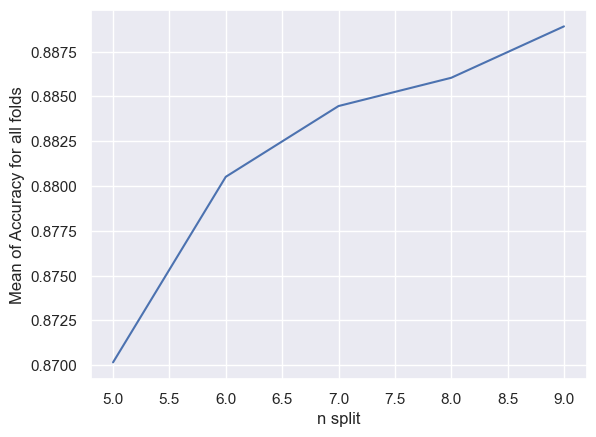

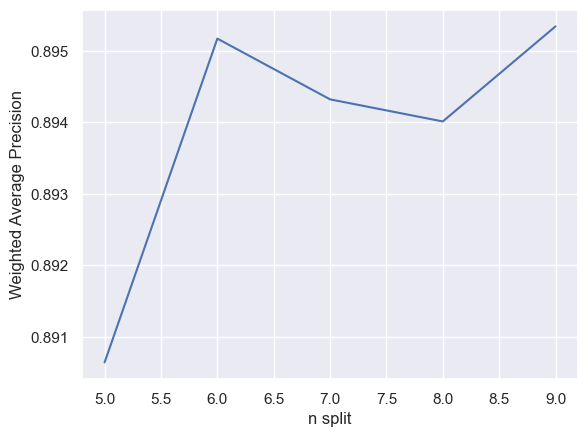

In [97]:
from sklearn.pipeline import make_pipeline
acc = []
precisions=[]
for n in range(5,10):
    
    pipe = make_pipeline(StandardScaler(), RidgeClassifier())

    # Note the results will vary each run since we take a different
    # subset of the data each time (since shuffle=True)
    scores = np.mean(cross_val_score(pipe, X, y, cv=n, scoring='accuracy'))
    acc.append(scores)
    p= np.mean(cross_val_score(pipe, X, y, cv=n, scoring=metrics.make_scorer(metrics.precision_score, average='weighted')))
    precisions.append(p)
    print('Mean of Accuracy for all ', str(n), ' folds: ', 'Scores: ', scores)
    print('Mean of Precision ', str(n), ' folds: ', 'Precision: ', p)

# plot to see clearly
plt.plot(range(5,10), acc)
plt.xlabel('n split')
plt.ylabel('Mean of Accuracy for all folds')
plt.show();
plt.plot(range(5,10), precisions)
plt.xlabel('n split')
plt.ylabel('Weighted Average Precision')
plt.show();

0.308515274444493

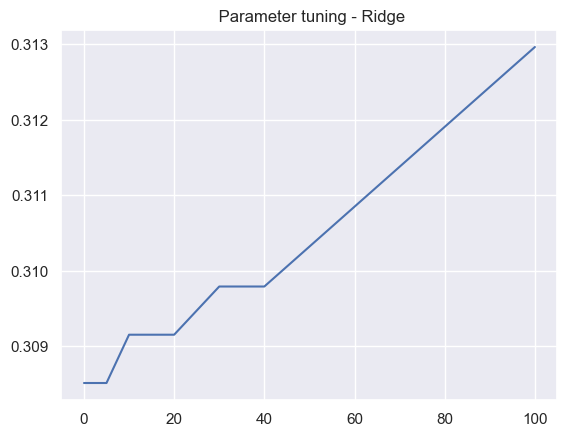

In [98]:
# Parameter Tuning with ridge error
def rmse_ridge(ridge_model):
    ridge_model.fit(X_train, y_train)
    ridge_pre = ridge_model.predict(X_test)
    squared = np.square(ridge_pre-y_test)
    ridge_error = np.sqrt(np.sum(squared)/len(y_test))
    return(ridge_error)

alphas = [0.01, 0.02, 0.1, 0.3, 1, 3, 5, 10, 20, 30,40,100]
cv_ridge = [rmse_ridge(RidgeClassifier(alpha = alpha )).mean() 
            for alpha in alphas]

cv_ridge = pd.Series(cv_ridge, index = alphas)
cv_ridge.plot(title = " Parameter tuning - Ridge")
cv_ridge.min()

In [99]:
import joblib
joblib.parallel_backend('threading')
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import StratifiedKFold

pipe=make_pipeline(StandardScaler(),RidgeClassifier()) #, class_weight='balanced'

grid_search = GridSearchCV(
    pipe, 
    {'ridgeclassifier__alpha': range(0,100)},  # Tried [0, 0.001, 0.01, 0.1, 0.5, 1, 1.5, 100] as well
    cv=StratifiedKFold(10, random_state=10, shuffle=True),
    scoring=metrics.make_scorer(metrics.recall_score), # maximise recall to minimise FN
    return_train_score=True,
    n_jobs=-1,
    verbose=3)

#X_sc = scaler.transform(X)  # can use this if I don't use pipe
grid_search.fit(X, y)
grid_search.best_estimator_

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


C:\Users\SURGE\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=3.98206e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\SURGE\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=7.91607e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\SURGE\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=3.98321e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


[CV 4/10] END ridgeclassifier__alpha=0;, score=(train=0.467, test=0.417) total time=   0.4s
[CV 5/10] END ridgeclassifier__alpha=1;, score=(train=0.467, test=0.417) total time=   0.3s
[CV 3/10] END ridgeclassifier__alpha=0;, score=(train=0.460, test=0.521) total time=   0.3s
[CV 10/10] END ridgeclassifier__alpha=0;, score=(train=0.464, test=0.457) total time=   0.3s
[CV 6/10] END ridgeclassifier__alpha=0;, score=(train=0.462, test=0.472) total time=   0.3s
[CV 8/10] END ridgeclassifier__alpha=0;, score=(train=0.463, test=0.444) total time=   0.4s
[CV 2/10] END ridgeclassifier__alpha=0;, score=(train=0.462, test=0.454) total time=   0.4s
[CV 1/10] END ridgeclassifier__alpha=1;, score=(train=0.459, test=0.534) total time=   0.4s
[CV 4/10] END ridgeclassifier__alpha=1;, score=(train=0.467, test=0.417) total time=   0.4s
[CV 1/10] END ridgeclassifier__alpha=0;, score=(train=0.459, test=0.534) total time=   0.4s
[CV 2/10] END ridgeclassifier__alpha=1;, score=(train=0.462, test=0.454) total 

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('ridgeclassifier', RidgeClassifier(alpha=1))])

* **Maximize recall:** best value found in **alpha = 0**
* **Maximize precision:** best value found **in alpha = 97**
* **Maximize accuracy:** best value found **in alpha = 5**

Let's run the model with those alphas to see if we going to get any better recall, precision or accuracy.

In [100]:
# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Ridge with alpha = 0
ridge = RidgeClassifier(alpha=0) #, class_weight='balanced'
ridge.fit(X_train, y_train)

C:\Users\SURGE\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=3.57075e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


RidgeClassifier(alpha=0)

In [101]:
print('Train Accuracy :',ridge.score(X_train, y_train))
print('Test Accuracy: ',ridge.score(X_test, y_test))

Train Accuracy : 0.8987491770901909
Test Accuracy:  0.9048183254344392


In [102]:
confisuon_matrix_summary_ridge(y_test, ridge)

,pred neg,pred pos
actual neg,2098,27
actual pos,214,193


Classification treshold is 0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.4742014742014742
False Positive Rate = FP/(FP+TN) : 0.012705882352941176
Accuracy = (TP+TN)/total : 0.9048183254344392
Precision = TP/(TP+FP) : 0.8772727272727273


In [103]:
y_pred = ridge.predict(X_test)
verify_performance(y_test, y_pred, ridge)

Weighted Average Precision: 0.9026


,0,1
individual precision,0.99,0.47


,0,1
0,0.99,0.01
1,0.53,0.47


In [104]:
# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Ridge with alpha = 0
ridge = RidgeClassifier(alpha=0, class_weight='balanced')
ridge.fit(X_train, y_train)

C:\Users\SURGE\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=2.3498e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


RidgeClassifier(alpha=0, class_weight='balanced')

In [105]:
print('Train Accuracy :',ridge.score(X_train, y_train))
print('Test Accuracy: ',ridge.score(X_test, y_test))

Train Accuracy : 0.8500329163923634
Test Accuracy:  0.8380726698262243


In [106]:
confisuon_matrix_summary_ridge(y_test, ridge)

,pred neg,pred pos
actual neg,1780,345
actual pos,65,342


Classification treshold is 0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.8402948402948403
False Positive Rate = FP/(FP+TN) : 0.1623529411764706
Accuracy = (TP+TN)/total : 0.8380726698262243
Precision = TP/(TP+FP) : 0.4978165938864629


In [107]:
y_pred = ridge.predict(X_test)
verify_performance(y_test, y_pred, ridge)

Weighted Average Precision: 0.8897


,0,1
individual precision,0.84,0.84


,0,1
0,0.84,0.16
1,0.16,0.84


We didn't get better recall value, actualy it was worse than previous logistic regression model(recall was 0.5773 in logreg) 

### KNN Classifier

Let's start with simple KNN model.

In [108]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=14)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=14)

In [109]:
print('Train Accuracy :',knn.score(X_train, y_train))
print('Test Accuracy: ',knn.score(X_test, y_test))

Train Accuracy : 0.8886109282422646
Test Accuracy:  0.877172195892575


In [110]:
most_freq_class = y_train.value_counts().index[0]
#Compute null accuracy.
y_test.value_counts()[most_freq_class] / len(y_test)

0.8392575039494471

In [111]:
confisuon_matrix_summary(y_test, knn, 0.5)

,pred neg,pred pos
actual neg,2110,15
actual pos,296,111


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.2727272727272727
False Positive Rate = FP/(FP+TN) : 0.007058823529411765
Accuracy = (TP+TN)/total : 0.877172195892575
Precision = TP/(TP+FP) : 0.8809523809523809


In [112]:
knn_pred_proba = knn.predict_proba(X_test)[:,1]
verify_performance(y_test, knn_pred_proba > .5, knn)

Weighted Average Precision: 0.8776


,0,1
individual precision,0.99,0.27


,0,1
0,0.99,0.01
1,0.73,0.27


In [113]:
scores = []
for k in range(1,101):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    pred = knn.predict(X_test)
    # Score with accuracy
    score = float(sum(pred == y_test)) / len(y_test)
    scores.append([k, score])

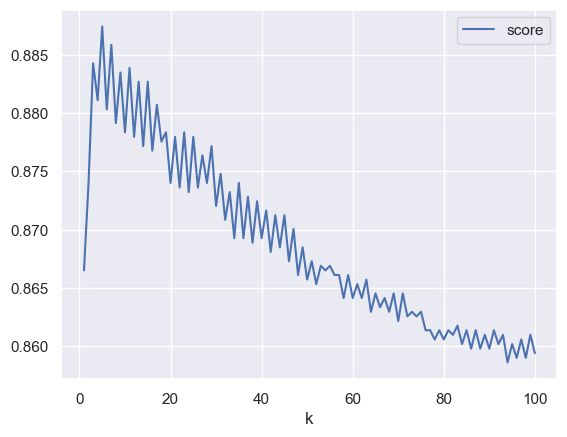

In [114]:
#maximize accuracy
data = pd.DataFrame(scores,columns=['k','score'])
data.plot.line(x='k',y='score');

**Maximize accuracy:** best value found in **k=5**

In [115]:
scores = []
for k in range(1,101):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    pred = knn.predict(X_test)
    # Score with precision
    score = metrics.precision_score(y_test,knn.predict(X_test))
    scores.append([k, score])

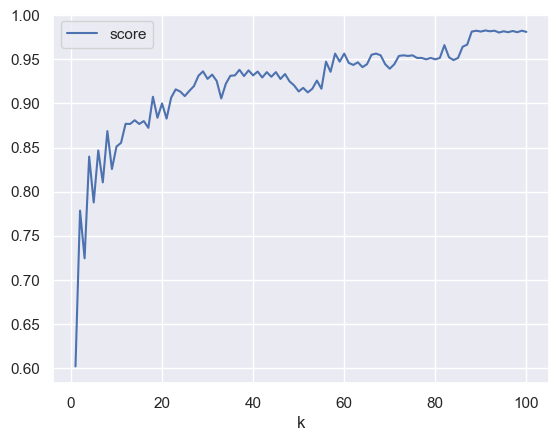

In [116]:
#miximize precision
data = pd.DataFrame(scores,columns=['k','score'])
data.plot.line(x='k',y='score');

**Maximize precision:** best value found in **k=99**

In [117]:
# Calculate TRAINING ERROR and TESTING ERROR for K=1 through 100

k_range = list(range(1, 101))
training_error = []
testing_error = []

# Find test accuracy for all values of K between 1 and 100 (inclusive).
for k in k_range:

    # Instantiate the model with the current K value.
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    
    # Calculate training error (error = 1 - accuracy).
    y_pred_class = knn.predict(X_train)
    training_accuracy = metrics.accuracy_score(y_train, y_pred_class)
    training_error.append(1 - training_accuracy)
    
    # Calculate testing error.
    y_pred_class = knn.predict(X_test)
    testing_accuracy = metrics.accuracy_score(y_test, y_pred_class)
    testing_error.append(1 - testing_accuracy)

In [118]:
# Create a DataFrame of K, training error, and testing error.
column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)
df.head()

,training error,testing error
K,,
100,0.137591,0.140600
99,0.137064,0.139021
98,0.137854,0.140995
97,0.136801,0.139415
96,0.137591,0.140995


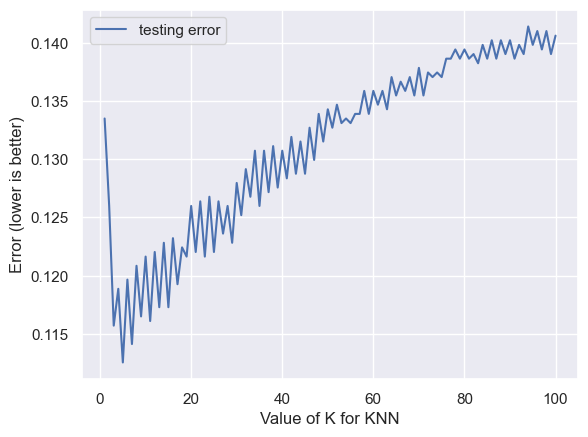

In [119]:
# Plot the relationship between K (HIGH TO LOW) and TESTING ERROR.
# Best k number is where Testing error is min
df.plot(y='testing error');
plt.xlabel('Value of K for KNN');
plt.ylabel('Error (lower is better)');

In [120]:
min(list(zip(testing_error, k_range)))

(0.11255924170616116, 5)

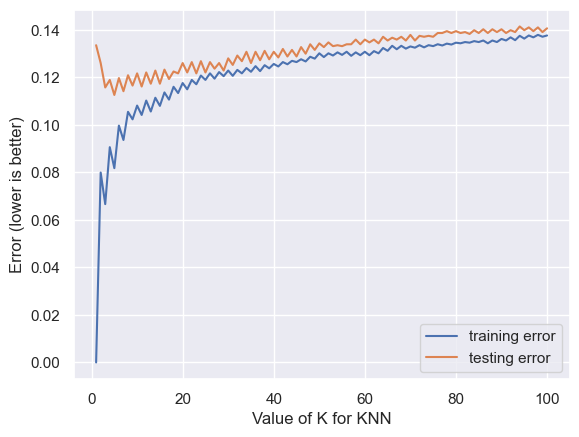

In [121]:
# Plot the relationship between K (HIGH TO LOW) and both TRAINING ERROR and TESTING ERROR.
df.plot();
plt.xlabel('Value of K for KNN');
plt.ylabel('Error (lower is better)');


Training error decreases as model complexity increases (lower value of K).

Testing error is minimized at the optimum model complexity.

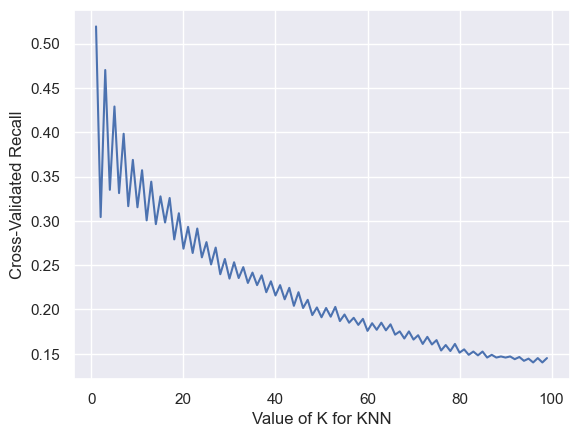

In [122]:
from sklearn.pipeline import make_pipeline
k_scores = []

# choose k between 1 to 49, step 2 to get odds
# use iteration to caclulator different k in models, then return the average accuracy based on the cross validation
for k in range(1, 100):
    knn = KNeighborsClassifier(n_neighbors=k)
    
    pipe = make_pipeline(StandardScaler(), knn)
    cv=StratifiedKFold(5, random_state=10, shuffle=True)
    scores = cross_val_score(pipe, X, y, cv=cv, scoring=metrics.make_scorer(metrics.recall_score)) #scoring=metrics.make_scorer(metrics.precision_score)
    k_scores.append(scores.mean())

# plot to see clearly
plt.plot(range(1, 100), k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Recall')
plt.show();

In [123]:
max_acc = max(k_scores)
for i, acc in zip(range(1, 100), k_scores):
    if acc == max_acc:
        print('k: ', i)
        print('max_recall: ', acc)

k:  1
max_recall:  0.5193732892873996


**Maximize recall:** scoring=metrics.make_scorer(metrics.recall_score) best value found in **k=1**

**Maximize precision:** scoring=metrics.make_scorer(metrics.precision_score) best value found in **k=99**

**Maximize accuracy:** scoring='accuracy' best value found in** k=5 and 7**

Now built the model with k=1 to find best recall for KNN.

In [124]:
# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [125]:
print('Train Accuracy :',knn.score(X_train, y_train))
print('Test Accuracy: ',knn.score(X_test, y_test))

Train Accuracy : 1.0
Test Accuracy:  0.8665086887835703


In [126]:
confisuon_matrix_summary(y_test, knn, 0.5)

,pred neg,pred pos
actual neg,1990,135
actual pos,203,204


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.5012285012285013
False Positive Rate = FP/(FP+TN) : 0.06352941176470588
Accuracy = (TP+TN)/total : 0.8665086887835703
Precision = TP/(TP+FP) : 0.6017699115044248


In [127]:
knn_pred_proba = knn.predict_proba(X_test)[:,1]
verify_performance(y_test, knn_pred_proba > .5, knn)

Weighted Average Precision: 0.8583


,0,1
individual precision,0.94,0.5


,0,1
0,0.94,0.06
1,0.50,0.50


0.5012 is not what we are looking for, I believe we can find better recall! Let's look at another model!

### Random Forest

Let's start with simple random forest mode. I'm bit scared that It'll overfit but c'est la vie.. :)

In [128]:
from sklearn.ensemble import RandomForestClassifier

# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

#Create a Random Forest Classifier
rfc=RandomForestClassifier(n_estimators=100, random_state = 42)

#Train the model using the training sets
rfc.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [129]:
print('Train Accuracy :',metrics.accuracy_score(y_train, rfc.predict(X_train)))
print('Test Accuracy: ',metrics.accuracy_score(y_test, rfc.predict(X_test)))

Train Accuracy : 1.0
Test Accuracy:  0.9620853080568721


Yup! It did overfit, but good new is test set prediction doesn't look bad at all!

In [130]:
confisuon_matrix_summary(y_test, rfc, 0.5)

,pred neg,pred pos
actual neg,2101,24
actual pos,72,335


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.8230958230958231
False Positive Rate = FP/(FP+TN) : 0.011294117647058824
Accuracy = (TP+TN)/total : 0.9620853080568721
Precision = TP/(TP+FP) : 0.9331476323119777


In [131]:
rfc_pred_proba = rfc.predict_proba(X_test)[:,1]
verify_performance(y_test, rfc_pred_proba > .5, rfc)

Weighted Average Precision: 0.9614


,0,1
individual precision,0.99,0.82


,0,1
0,0.99,0.01
1,0.18,0.82


Oh awesome, we are getting somewhere! Recall is 0.823 yeey! Let's tune this bad boi and see if we can increase this!

In [132]:
n_estimators = [100, 200, 300]
max_depth = [5, 10,  25]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 5, 10]
#ccp_alpha = [0, 0.01, 0.1, 1]

hyperF = dict(n_estimators = n_estimators, 
              max_depth = max_depth, 
              min_samples_split = min_samples_split, 
              min_samples_leaf = min_samples_leaf)
             # ccp_alpha = ccp_alpha)

grid_search = GridSearchCV(RandomForestClassifier(), 
                           hyperF, 
                           cv=StratifiedKFold(5, random_state=10, shuffle=True),
                           scoring=metrics.make_scorer(metrics.recall_score),
                           verbose = 3, 
                           n_jobs = -1)

grid_search.fit(X, y)
grid_search.best_estimator_

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV 1/5] END max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.558 total time=   4.9s
[CV 1/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.564 total time=   5.3s
[CV 4/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.538 total time=   5.4s
[CV 5/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.551 total time=   5.5s
[CV 3/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.495 total time=   5.5s
[CV 2/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.488 total time=   5.6s
[CV 3/5] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.508 total time=   9.1s
[CV 2/5] END max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.457 total time=   4.3s
[

RandomForestClassifier(max_depth=25, min_samples_split=10)

In [133]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=25, min_samples_split=10)

Let's try out new model with better parameters to get better recall score.

In [134]:
from sklearn.ensemble import RandomForestClassifier

# set x and y
X = bankchurners_df.drop('churn', axis = 1)
y = bankchurners_df['churn']

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99, stratify=y)

#Create a Random Forest Classifier
rfc=RandomForestClassifier(n_estimators=200, 
                           max_depth=25, 
                          # min_samples_leaf=5, 
                           min_samples_split=5, 
                           random_state = 42)

#Train the model using the training sets 
rfc.fit(X_train,y_train)

RandomForestClassifier(max_depth=25, min_samples_split=5, n_estimators=200,
                       random_state=42)

In [135]:
print('Train Accuracy :',metrics.accuracy_score(y_train, rfc.predict(X_train)))
print('Test Accuracy: ',metrics.accuracy_score(y_test, rfc.predict(X_test)))

Train Accuracy : 0.9984200131665569
Test Accuracy:  0.9656398104265402


In [136]:
confisuon_matrix_summary(y_test, rfc, 0.5)

,pred neg,pred pos
actual neg,2103,22
actual pos,65,342


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.8402948402948403
False Positive Rate = FP/(FP+TN) : 0.010352941176470589
Accuracy = (TP+TN)/total : 0.9656398104265402
Precision = TP/(TP+FP) : 0.9395604395604396


In [137]:
print('Train Accuracy :',metrics.accuracy_score(y_train, rfc.predict(X_train)))
print('Test Accuracy: ',metrics.accuracy_score(y_test, rfc.predict(X_test)))

Train Accuracy : 0.9984200131665569
Test Accuracy:  0.9656398104265402


In [138]:
confisuon_matrix_summary(y_test, rfc, 0.5)

,pred neg,pred pos
actual neg,2103,22
actual pos,65,342


Classification treshold is  0.5
True Positive Rate/Recall = TP/(TP+FN) : 0.8402948402948403
False Positive Rate = FP/(FP+TN) : 0.010352941176470589
Accuracy = (TP+TN)/total : 0.9656398104265402
Precision = TP/(TP+FP) : 0.9395604395604396


In [139]:
rfc_pred_proba = rfc.predict_proba(X_test)[:,1]
verify_performance(y_test, rfc_pred_proba > .5, rfc)

Weighted Average Precision: 0.9651


,0,1
individual precision,0.99,0.84


,0,1
0,0.99,0.01
1,0.16,0.84


0.84 recall score and 0.9395 precison and 0.9656 accuracy is pretty good! 

# Result

Random Forest gave the best recall score, precision and accuracy!

Logistic Regresion:
* **Recall**: 0.5773
* **Precison** Score: 0.7669
* **Accuracy**: 0.9040

Ridge Classifier:
* **Recall**: 0.4742
* **Precison** Score: 0.8772
* **Accuracy**: 0.9048

KNN:
* **Recall**: 0.5012
* **Precison** : 0.6017
* **Accuracy**: 0.8665

Random Forest:
* **Recall**: 0.8402
* **Precison** : 0.9395
* **Accuracy**: 0.9656